<a href="https://colab.research.google.com/github/TuringCollegeSubmissions/mkolka-DL.4/blob/master/FakeTrueNewsClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Classification of Fake and True News <a class="jp-toc-ignore"></a>

# Introduction
The purpose of this notebook is to estimate if the news is consistent with facts or not. The predictions are done using the dataset stored at https://www.kaggle.com/clmentbisaillon/fake-and-real-news-dataset. Unfortunately the dataset is lacking the description how was it stored. From the discussion forum one user suggests that the dataset is a scrape from https://www.politifact.com/ which is a non-profit organization preventing spead of fake news which are detrimental in forming public opinion and crutial for manipulating the mass media. This is not confirmed in any other source. The website has a truth-o-meter where independent journalists analyse if the news is factual.

If the data was trully scraped from this website it would be much easier to establish it's usefullness.

Through the analysis of the true.csv and fake.csv we were able to pick up on the stracture of news that would straigh away predict with high accuracy the truthfullness of the news. Because of that the approach consisted of removing as many features as possible that would leak the information too much and make our predictions more universal.

The main metric that was used through modeling was f1 score weighted.

The noetbook consists of:
* removing duplicates
* datetime analysis
* insepecting columns
* manual analysis of the text
* cleaning text
* splitting with two approaches: statified split and split based on date
* modeling with classic ML approach with the use of features engineered based on calculations ex. proportion of upper case letters in the text.
* deep learning modeling with the use of pretrained distilbert cased for predictions with stratified split for 'title' and 'text' separately.



# Imports and functions

In [1]:
!pip install --quiet shap torch pytorch-lightning transformers[torch] lime torchmetrics tensorboardX nlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 777.7/777.7 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 29.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 47.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 15.8 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import pandas as pd
import scipy as sp
import time
from typing import List, Tuple, Union, Dict, Any
from pprint import pprint
from collections import defaultdict
import pickle
import string
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from sklearn.feature_extraction.text import (TfidfVectorizer,
                                             CountVectorizer)
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import (accuracy_score,
                             f1_score,
                             confusion_matrix,
                             classification_report)
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

import torch
from torch import nn
import torch.nn.functional as F
from torch.optim import AdamW
from torch.utils.data import Dataset, DataLoader
from torch.nn import BCELoss

import pytorch_lightning as pl
from pytorch_lightning.callbacks import (ModelCheckpoint,
                                         EarlyStopping,
                                         Callback)
from pytorch_lightning.loggers import TensorBoardLogger
from torchmetrics.classification import BinaryAccuracy



from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer

from tensorboardX import SummaryWriter
from tensorboard.backend.event_processing import event_accumulator

import lime
import lime.lime_text
from lime.lime_text import LimeTextExplainer
import shap

import nlp
from nlp import Dataset as nlpDataset

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [3]:
# ****************************** DATA CLEANING ******************************
def clean_duplicates(df: pd.DataFrame(),
                     cols: List=['text', 'title'],
                     cos_threshold: float=0.8) -> pd.DataFrame():
    """
    Removes duplicate rows based on specified columns and cosine similarity threshold.
    Args:
        df (pd.DataFrame): Input DataFrame.
        cols (List[str]): List of columns to check for duplicates.
        cos_threshold (float): Cosine similarity threshold for considering rows as duplicates.
    Returns:
        pd.DataFrame: DataFrame with duplicates removed.
    """

    print(f'Shape of df before duplicates removal: {df.shape}')
    for col in cols:
        bool_mask = df.duplicated(subset=[col])
        df = df[~bool_mask].reset_index(drop=True)
        vectorizer = TfidfVectorizer(stop_words='english')
        tfidf_matrix = vectorizer.fit_transform(df[col])
        similarity_matrix = cosine_similarity(tfidf_matrix, tfidf_matrix)
        duplicates = []
        for i in range(len(similarity_matrix)):
            for j in range(i + 1, len(similarity_matrix)):
                if similarity_matrix[i, j] > cos_threshold:
                    duplicates.append(j)
        df = df.drop(duplicates, axis=0).reset_index(drop=True)

    print(f'Shape of df after duplicates removal: {df.shape}')
    return df

def remove_http(text: str) -> str:
    """Removes http and https from strings."""
    return re.sub(r'http[s]?://\S+', '', text)

def remove_punctuation(text: str) -> str:
    """
    Remove punctuation from the given text.
    Args:
        text (str): Input text.
    Returns:
        str: Text with punctuation removed.
    """
    translation_table = str.maketrans('', '', string.punctuation)
    text = text.translate(translation_table)
    text = text.strip()
    return text

def remove_words(text: str, words_to_remove: List[str]) -> str:
    """
    Remove specified words from the given text.
    Parameters:
        text (str): Input text.
        words_to_remove (List[str]): List of words to be removed.
    Returns:
        str: Text with specified words removed.
    """
    filtered_words = [word for word in text.split()
                    if remove_punctuation(word.lower()) not in words_to_remove]
    text = ' '.join(filtered_words)
    return text

def tweet_only(text: str) -> str:
    """
    Extract the tweet content by removing mentions and trailing characters.
    Args:
        text (str): Input text.
    Returns:
        str: Extracted tweet content.
    """
    if '(@' in text:
        text = ' '.join(text.split('(@')[0].split()[:-3])
    return text

def remove_single_letter(text: str) -> str:
    """
    Removes single-letter words from the given text.
    Args:
        text (str): Input text.
    Returns:
        str: Text with single-letter words removed.
    """
    filtered_words = [word for word in text.split() if len(word) > 1]
    text = ' '.join(filtered_words)
    return text

def remove_stopwords(text: str) -> str:
    """
    Removes stopwords from the given text.
    Args:
        text (str): Input text.
    Returns:
        str: Text with stopwords removed.
    """
    stop_words = set(stopwords.words('english'))
    filtered_words = [word for word in text.split()
                    if word.casefold() not in stop_words]
    text = ' '.join(filtered_words)
    return text

def total_char(text: str) -> int:
    """
    Calculate the total number of characters in the given text.
    Args:
        text (str): Input text.
    Returns:
        int: Total number of characters.
    """
    return len(text)

def total_words(text: str) -> int:
    """
    Calculate the total number of words in the given text.
    Parameters:
        text (str): Input text.
    Returns:
        int: Total number of words.
    """
    return len(text.split())

def calculate_uppercase_proportion(text: str) -> float:
    """
    Calculate the proportion of uppercase characters in the given text.
    Args:
        text (str): Input text.
    Returns:
        float: Proportion of uppercase characters.
    """
    uppercase_count = sum(1 for char in text if char.isalpha() and char.isupper())
    total = total_char(text)
    if total == 0:
        return 0.0
    else:
        return uppercase_count / total

def average_word_length(text: str) -> float:
    """
    Calculate the average length of words in the given text.
    Args:
        text (str): Input text.
    Returns:
        float: Average word length.
    """
    lengths = [len(word) for word in text.split()]
    if len(lengths) > 0:
        return np.mean(lengths)
    else:
        return 0.0

def punctuation_proportion(text: str) -> float:
    """
    Calculate the proportion of punctuation characters in the given text.
    Args:
        text (str): Input text.
    Returns:
        float: Proportion of punctuation characters.
    """
    punc = [p for p in text if p in string.punctuation]
    total = total_char(text)
    if total == 0:
        return 0.0
    else:
        return len(punc) / total

def exclamation_mark_proportion(text: str) -> float:
    """
    Calculate the proportion of exclamation marks in the given text.
    Args:
        text (str): Input text.
    Returns:
        float: Proportion of exclamation marks.
    """
    exc = [char for char in text if char == '!']
    total = total_char(text)
    if total == 0:
        return 0.0
    else:
        return len(exc) / total

def dot_proportion(text: str) -> float:
    """
    Calculate the proportion of dot characters in the given text.
    Args:
        text (str): Input text.
    Returns:
        float: Proportion of dot characters.
    """
    dot = [char for char in text if char == '.']
    total = total_char(text)
    if total == 0:
        return 0.0
    else:
        return len(dot) / total

def get_top_text_ngrams(corpus: List[str], g: int, n: int = 10) -> List[Tuple[str, int]]:
    """
    Get the top N n-grams from the given text corpus.
    Args:
        corpus (List[str]): List of text documents.
        g (int): N-gram value.
        n (int): Number of top n-grams to retrieve (default is 10).
    Returns:
        List[Tuple[str, int]]: List of tuples containing n-grams and their frequencies.
    """
    vec = CountVectorizer(ngram_range=(g, g)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

def compare_grams(corpuses: List[List[str]], names: List[str], grams: List[int]) -> None:
    """
    Compare the most important n-grams in different text corpora and plot the results.
    Args:
        corpuses (List[List[str]]): List of text corpora.
        names (List[str]): List of names corresponding to each corpus.
        grams (List[int]): List of n-gram values to compare.
    Returns:
        None
    """
    col = len(corpuses)
    rows = len(grams)
    fig, axs = plt.subplots(rows, col, figsize=(5 * col, 4 * rows))
    for i, corpus in enumerate(corpuses):
        for j, gram in enumerate(grams):
            most_common_ngrams = get_top_text_ngrams(corpus, gram)
            most_common_ngrams_dict = dict(most_common_ngrams)
            sns.barplot(x=list(most_common_ngrams_dict.values()), y=list(most_common_ngrams_dict.keys()), ax=axs[j, i])
            axs[j, i].set_title(f'{gram}-gram most important word(s) in {names[i]} news')
    plt.tight_layout()

def prepare_text(text: str) -> str:
    """
    Preprocess the given text by removing punctuation and stopwords, and converting to lowercase.
    Args:
        text (str): Input text.
    Returns:
        str: Processed text.
    """
    text = remove_punctuation(text)
    text = remove_stopwords(text).lower()
    return text

def build_feature_df(df: pd.DataFrame, col: str = 'text') -> pd.DataFrame:
    """
    Build a DataFrame of text features based on the specified column.
    Args:
        df (pd.DataFrame): Input DataFrame.
        col (str): Name of the column in the DataFrame containing text data
                   (default is 'text'column).
    Returns:
        pd.DataFrame: DataFrame with text features.
    """
    df_features = pd.DataFrame()
    df_features['upper_case'] = df[col].map(calculate_uppercase_proportion)
    df_features['avg_word_len'] = df[col].map(average_word_length)
    df_features['str_len'] = df[col].map(total_char)
    df_features['words_len'] = df[col].map(total_words)
    df_features['punct_prop'] = df[col].map(punctuation_proportion)
    df_features['exc_prop'] = df[col].map(exclamation_mark_proportion)
    df_features['dot_prop'] = df[col].map(dot_proportion)
    return df_features

# ****************************** PLOTTING ******************************
def plot_target_distribution(serie: pd.Series) -> None:
    """
    Plot the distribution of target values in a given Pandas Series.
    Args:
        serie (pd.Series): Input Pandas Series representing the target values.
    Returns:
        None
    """
    value_count = serie.value_counts(normalize=True)
    value_count.plot(kind='bar')
    plt.xticks(ticks=[0, 1], labels=['True', 'Fake'], rotation='horizontal')
    plt.title('Distribution of Target')
    plt.show()

def plot_features(df: pd.DataFrame) -> None:
    """
    Plot the distribution of features for true and fake news in a DataFrame.
    Args:
        df (pd.DataFrame): Input DataFrame with features and target column.
    Returns:
        None
    """
    rows = len(df.columns) - 1
    columns = [col for col in df.columns if col != 'target']
    fig, axs = plt.subplots(rows, 1, figsize=(10, rows * 5))
    for ax, col in zip(axs, columns):
        sns.boxplot(data=df, x='target', y=col, ax=ax)
        ax.set_xticks(ticks=[0, 1], labels=['True', 'Fake'], rotation='horizontal')
        ax.set_xlabel("")
    plt.tight_layout()
    fig.suptitle("Comparison of distribution of given feature for fake and true news", y=1.02)
    plt.show()

def plot_clf_metrics(model: nn.Module, loader: DataLoader,
                     norm: Union[str, None] = None) -> None:
    """
    Plot the confusion matrix and classification report for a classification model.
    Args:
        model: Classification model.
        loader: Data loader.
        norm (str or None): Normalization option for the confusion matrix (None, 'true', 'pred', or 'all').
    Returns:
        None
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    m = model.eval().to(device)
    y_proba = torch.Tensor().to(device)
    y_true = torch.Tensor().to(device)
    for batch in loader:
        batch = {key: value.to(device) for key, value in batch.items()}
        with torch.no_grad():
            predictions = m(**batch)
            pred = predictions[0]
            y_proba = torch.cat((y_proba, pred), dim=0)
            y_true = torch.cat((y_true, batch['labels']), dim=0)

    y_proba = y_proba.cpu().numpy()
    y_true = y_true.cpu().numpy()

    y_hat = np.where((y_proba > 0.5), 1, 0)
    cm = confusion_matrix(y_true, y_hat, normalize=norm)
    plt.figure(figsize=(6, 4))
    classes = ['True', 'Fake']
    sns.heatmap(cm, annot=True, cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    report = classification_report(y_true, y_hat, target_names=classes)
    print()
    print("Classification Report:")
    print(report)
    incorrect_indices = [i for i, (true, pred) in enumerate(zip(y_true, y_hat)) if true != pred]

    print(f"Wrongly classified: {incorrect_indices}")

# ****************************** MODELING ******************************

def find_best_threshold(y_true: np.array, y_probabilities: np.array, 
                        thresholds=None, min_val: float=0.3,
                        max_val: float=0.7, step:float=0.01) -> Tuple[float, float]:
    """
    Find the best threshold based on F1 score weighted.
    Args:
        y_true: true labels (ground truth)
        y_probabilities: predicted probabilities for the positive class
        thresholds: list of thresholds to evaluate, default is None (use a range of thresholds)
    Returns:
        best_threshold: the threshold that maximizes the F1 score
        best_f1_score: the corresponding F1 score
    """
    if thresholds is None:
        thresholds = np.arange(min_val, max_val, step)

    best_threshold = None
    best_f1_score = 0

    for threshold in thresholds:
        y_pred = (y_probabilities > threshold).astype(int)
        f1 = f1_score(y_true, y_pred, average='weighted')

        if f1 > best_f1_score:
            best_f1_score = f1
            best_threshold = threshold

    return best_threshold, best_f1_score

def get_pipeline(model, vocab: List[str] = None) -> Pipeline:
    """
    Create a feature processing and modeling pipeline.
    Args:
        model: Classic machine learning model for classification from sklearn.
        vocab (List[str]): Vocabulary for TfidfVectorizer (default is None).
    Returns:
        Pipeline: Feature processing and modeling pipeline.
    """
    calc_transformer = FunctionTransformer(build_feature_df, validate=False)

    if vocab is None:
        pipeline = Pipeline([
            ('calc_features', calc_transformer),
            ('scaler', StandardScaler()),
            ('model', model)
        ])
    else:
        vec_transformer = ColumnTransformer(
            transformers=[
                ('vec_features',
                 TfidfVectorizer(vocabulary=vocab, preprocessor=prepare_text),
                'text')
            ]
        )

        feature_union = FeatureUnion(
            transformer_list=[
                ('calc_features', calc_transformer),
                ('vec_features', vec_transformer)
            ]
        )

        pipeline = Pipeline([
            ('features', feature_union),
            ('scaler', StandardScaler()),
            ('model', model)
        ])

    return pipeline

def train_and_evaluate(models: Dict,
                       X_train: pd.DataFrame,
                       y_train: np.ndarray,
                       X_valid: pd.DataFrame,
                       y_valid: np.ndarray,
                       vocab: List[str] = None) -> pd.DataFrame:
    """
    Train and evaluate multiple models using the specified datasets.
    Args:
        models (Dict): Dictionary of model names and corresponding models.
        X_train (pd.DataFrame): Training features.
        y_train (np.ndarray): Training labels.
        X_valid (pd.DataFrame): Validation features.
        y_valid (np.ndarray): Validation labels.
        vocab (List[str]): Vocabulary for TfidfVectorizer (default is None).
    Returns:
        pd.DataFrame: DataFrame with evaluation scores for each model.
    """
    names = []
    scores = defaultdict(list)

    for name, model in models.items():
        pipeline = get_pipeline(model, vocab)
        pipeline.fit(X_train, y_train)

        proba_train = pipeline.predict_proba(X_train)[:, 1]
        thre, f1_score_train = find_best_threshold(y_train, proba_train)

        scores['threshold'].append(thre)
        scores['f1_train'].append(f1_score_train)

        proba_valid = pipeline.predict_proba(X_valid)[:, 1]
        scores['f1_valid'].append(f1_score(y_valid, np.where(proba_valid > thre, 1, 0), average='weighted'))

        names.append(name)

    return pd.DataFrame(scores, index=names)

def training(
    model: pl.LightningModule,
    logger: pl.loggers,
    callbacks: List[pl.Callback],
    train_epochs: int = 1,
    finetune_epochs: int = 8,
    train_lr: float = 1e-4,
    finetune_lr: float = 1e-5,
) -> None:
    """
    Trains and fine-tunes the model.
    Args:
        model (pl.LightningModule): PyTorch Lightning model
        logger (pl.loggers.base.LightningLoggerBase): logger for tracking training
        callbacks (List[pl.Callback]): list of PyTorch Lightning callbacks
        train_epochs (int): number of epochs for the initial training
        finetune_epochs (int): number of epochs for the fine-tuning
        train_lr (float): learning rate for the initial training
        finetune_lr (float): learning rate for the fine-tuning
    Returns:
        None
    """
    start = time.time()
    print("*" * 25, "Training", "*" * 25)

    # Initial Training
    trainer = pl.Trainer(max_epochs=train_epochs, accumulate_grad_batches=2)
    trainer.fit(model)

    print("*" * 25, "Training", "*" * 25)

    # Fine-tuning
    model.base_grad(True)
    model.lr = finetune_lr
    fine_trainer = pl.Trainer(
        logger=logger,
        callbacks=callbacks,
        max_epochs=finetune_epochs,
        accumulate_grad_batches=2,
    )
    fine_trainer.fit(model)

    end = time.time()
    execution_time = end - start
    print(f"Execution time: {round(execution_time/3600, 1)} hours.")

# ****************************** EXPLAINING MODELS ******************************
def predict_function(texts: List[str],
                     checkpoint_path: str,
                     base: nn.Module,
                     words: List[str]) -> np.ndarray:
    """
    Predict the probabilities of each class for a list of texts using a pretrained model.
    Args:
        texts (List[str]): List of input texts.
        checkpoint_path (str): Path to the checkpoint of the pretrained model.
        base (nn.Module): Base model type.
        words (List[str]): List of words to remove from the texts.
    Returns:
        np.ndarray: Array of predicted probabilities for each class.
    """
    processed_texts = [remove_words(text, words) for text in texts]
    tokenized_inputs = [tokenizer.encode_plus(
        text,
        add_special_tokens=True,
        max_length=512,
        padding='max_length',
        return_attention_mask=True,
        truncation=True,
        return_tensors="pt"
    ) for text in processed_texts]

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    inputs = []

    for item in tokenized_inputs:
        one_dict = {k: v.squeeze(0).to(device) for k, v in item.items()}
        inputs.append(one_dict)

    model = NewsModel.load_from_checkpoint(checkpoint_path, base=base)
    m = model.eval().to(device)

    desired_shape = (len(inputs), 2)
    preds = []

    with torch.no_grad():
        for input in inputs:
            outputs = m(**input)
            predictions = torch.Tensor([1 - outputs[0], outputs[0]]).to(device)
            preds.append(predictions.tolist())

    return np.array(preds)

class SurrogateModel(pl.LightningModule):
    """
    PyTorch Lightning module for a surrogate model for shap predictions.
    Attributes:
        classifier (nn.Module): Base classification model.
    Methods:
        forward(*args, **kwargs) -> torch.Tensor: Forward pass of the model.
    Parameters:
        base (nn.Module): Base classification model.
    """
    def __init__(self, base: nn.Module):
        super().__init__()
        self.classifier = base

    def forward(self, *args: Any, **kwargs: Any) -> torch.Tensor:
        """
        Forward pass of the surrogate model.
        """
        output = self.classifier(*args, **kwargs)
        out = F.softmax(output.logits, dim=-1)
        return out


def shap_func(x: List[str], surrogate: SurrogateModel, tokenizer: AutoTokenizer) -> np.ndarray:
    """
    Compute Shapley values for a list of texts using a surrogate model.
    Args:
        x (List[str]): List of input texts.
        surrogate (SurrogateModel): Surrogate model.
        tokenizer (): Tokenizer for encoding the texts.
    Returns:
        np.ndarray: Array of Shapley values.
    """
    tv = torch.tensor([
        tokenizer.encode(v, padding="max_length", max_length=20, truncation=True)
        for v in x
    ]).cuda()

    outputs = surrogate(tv).detach().cpu().numpy()
    val = sp.special.logit(outputs[:, 1])
    return val

# EDA

## Familiarization with the data

In [6]:
fake = pd.read_csv('/content/drive/MyDrive/Colab/FakeNews/Fake.csv')
display(fake.tail(1))
print(f'Shape: {fake.shape}')

,title,text,subject,date
23480,10 U.S. Navy Sailors Held by Iranian Military ...,21st Century Wire says As 21WIRE predicted in ...,Middle-east,"January 12, 2016"


Shape: (23481, 4)


In [7]:
true = pd.read_csv('/content/drive/MyDrive/Colab/FakeNews/True.csv')
display(true.tail(1))
print(f'Shape: {true.shape}')

,title,text,subject,date
21416,Indonesia to buy $1.14 billion worth of Russia...,JAKARTA (Reuters) - Indonesia will buy 11 Sukh...,worldnews,"August 22, 2017"


Shape: (21417, 4)


* There are two dataframes with either fake or true news.
* Fake news have 23481 entries while true news 21417.
* Both dataframes consist of the same columns.
* The last date entries are inconsistent but we will analyse it further in the EDA part.

## Cleaning data from duplicates

To perform EDA and the split for training we need to first remove duplicated values for columns that will be used for modeling. Here we will remove duplicated values from 'text' and 'title' columns.

In [ ]:
fake = clean_duplicates(fake)

Shape of df before duplicates removal: (23481, 4)
Shape of df after duplicates removal: (17166, 4)


In [ ]:
true = clean_duplicates(true)

Shape of df before duplicates removal: (21417, 4)
Shape of df after duplicates removal: (20425, 4)


And we will store the data to prevent removing duplicates each time we run the notebook.

In [ ]:
fake.to_csv('/content/drive/MyDrive/Colab/FakeNews/fake.csv', index=False)
true.to_csv('/content/drive/MyDrive/Colab/FakeNews/true.csv', index=False)

From now on we will be able to start using the dataset with removed duplicates.

In [8]:
fake = pd.read_csv('/content/drive/MyDrive/Colab/FakeNews/fake.csv')
true = pd.read_csv('/content/drive/MyDrive/Colab/FakeNews/true.csv')

## Inspecting dates of news

Here we will use the buildin function and try to infer the datetime format. We need to be aware that some of the entries can be wrongly inferred and the null value assigned.

In [9]:
fake['date'] = pd.to_datetime(fake['date'],  infer_datetime_format=True, errors='coerce')
true['date'] = pd.to_datetime(true['date'],  infer_datetime_format=True, errors='coerce')

In [10]:
print(f"The fraction of missing date in true news: {true['date'].isna().mean():.2f}")
print(f"The fraction of missing date in fake news: {fake['date'].isna().mean():.2f}")

The fraction of missing date in true news: 0.00
The fraction of missing date in fake news: 0.39


We see that almost 40% of values in data column is missing. Let's analyse it further. This fenomena could on it's own be a predictive feature.

Let's see if there is any pattern of missing dates and indices.

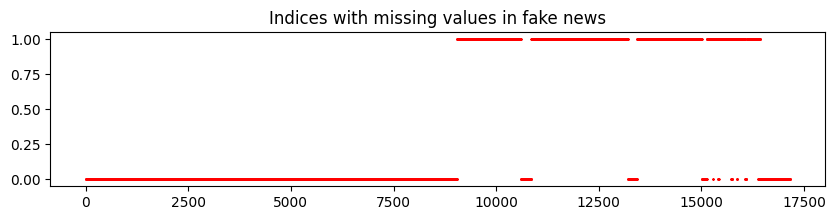


First value in fake news for date: 
date    2017-12-31 00:00:00
Name: 0, dtype: object 


Last value in fake news for date: 
date    2016-01-02 00:00:00
Name: 17165, dtype: object 



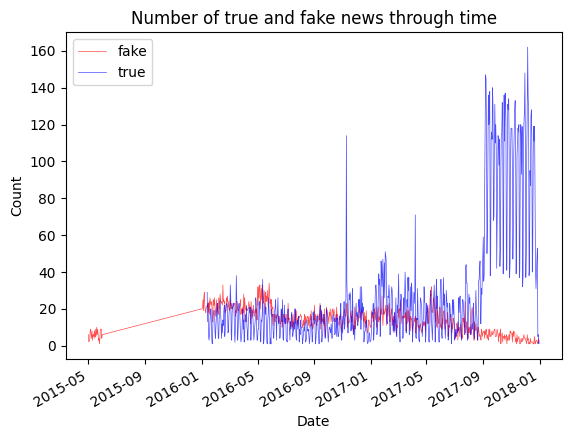


Indices of values before 2016-01-02: 
Int64Index([ 9025,  9026,  9027,  9028,  9029,  9030,  9031,  9032,  9033,
             9034,
            ...
            16400, 16401, 16402, 16403, 16404, 16405, 16406, 16407, 16408,
            16409],
           dtype='int64', length=199)


In [11]:
plt.figure(figsize=(10, 2))
plt.scatter(fake.index, fake['date'].isna(), color='red', marker='.', s=0.5)
plt.title('Indices with missing values in fake news')
plt.show()
print(f"\nFirst value in fake news for date: \n{fake.loc[0, ['date']]} \n")
print(f"\nLast value in fake news for date: \n{fake.loc[17165, ['date']]} \n")
fake['date'].value_counts().sort_index().plot(color='red', label='fake', linestyle='-', alpha=0.7, linewidth=0.5)
true['date'].value_counts().sort_index().plot(color='blue', label='true', linestyle='-', alpha=0.7, linewidth=0.5)
plt.title('Number of true and fake news through time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.show()
print(f"\nIndices of values before 2016-01-02: \n{fake[fake['date'] < '2016-01-02'].index}")

To truly remove any date bias from the dataframe we would need to remove all data from fake news with missing value of date as the dataframe isn't ordered by date and we can't confidently fillin the date values as well all values before January 2016. This operation would eat up around 40% of our fake data.

Then we would need to split data in the point where the imbalance between dates rises and use the freshest data to validate and test model performance.


## Checking unique values of subject column


In [ ]:
true['subject'].unique(), fake['subject'].unique()

(array(['politicsNews', 'worldnews'], dtype=object),
 array(['News', 'politics', 'Government News', 'left-news', 'US_News'],
       dtype=object))

Using columns for subject of the news is unrelevant as the unique values are very different and to easy for the model to pick up on this pattern. It wouldn't generalize well.

## Manual analysis of the random text samples from the dataframes

In [14]:
print('Random fake title: ')
pprint(fake.loc[[123], ['title']]['title'].tolist()[0])
print('Random fake text: ')
pprint(fake.loc[[123], ['text']]['text'].tolist()[0])
print('Random true title: ')
pprint(true.loc[[42], ['title']]['title'].tolist()[0])
print('Random true text: ')
pprint(true.loc[[42], ['text']]['text'].tolist()[0])

Random fake title: 
(' Miss Texas Gave A VERY Unexpected Answer When Asked About Trump, And '
 'Republicans Are Furious')
Random fake text: 
('Long before Cara Mund,  Miss North Dakota,  won the 2018 Miss America '
 'pageant, she faced a crowd of 50 other young women, all competing in various '
 'categories for the coveted crown. Two of those categories, to most of our '
 'readers, are patriarchal and silly: The evening wear and swimwear  '
 'competitions  pit all these beautiful young women against one another for '
 'assessment on their looks by a panel of judges.The other two categories, '
 'however, can be quite interesting, especially when something happens like '
 'what went down with Miss Texas in this year s competition.The talent portion '
 'of the show is, of course, just plain entertaining. Perhaps you ve seen the '
 'movie Miss Congeniality, starring Sandra Bullock, and if you have, you know '
 'what I m hoping to see in a talent show. The real thing is very little like '
 

The fake text looks like the scrap from twitter with comments. To remove the bias from the text we would need to separate the post by '(@' and take only first part, remove the author of the post and any of the lone letters which are the effect of improper scrapping.

Let's quickly see how many values of our data is comming from twitter for fake data and how many is comming from reuters in true news.

In [16]:
count_mentions = (fake['text'].str.lower().str.contains(r'\(@')).sum()
round(count_mentions/fake.shape[0], 3)

0.25

In [17]:
count_reuters = (true['text'].str.lower().str.contains('reuters')).sum()
round(count_reuters/true.shape[0], 3)

0.998

* 25% of fake news are comming from twitter and contain '(@'
* Almost all true news are having word 'reuters' in them.

## Heuristic function predictions

Let's check the impact of given symbols on predicting the correct class.

In [18]:
fake['target'] = 1
true['target'] = 0
df = pd.concat([fake, true])
df = df.drop(df[df['date'] < '2016-01-02'].index)

In [19]:
def predict_fake(text: str, word: str='reuters') -> int:
    """Makes predictions based on the accurrance
    of certain string."""
    word_count = text.lower().count(word)
    if word_count > 0:
        output = 0
    else:
        output = 1
    return output

In [20]:
df['pred_fake'] = df['text'].map(predict_fake)
print(f"Accuracy for the use of word reuters only: {accuracy_score(df['target'], df['pred_fake']):.3f}")

Accuracy for the use of word reuters only: 0.993


More than 4k fake informations are comming from twitter.
Almost all true informations have word 'reuters' in them which would be the first word to classify posts with accuracy close to 1 while the '(@' on its own gave accuracy close to 0.66 and when the number of proportion of upper case letters with the threshold 0.245 we've got the accuracy of 0.65.

To prevent any information leakage comming from the words of the source of news we need to remove them. The classifier should be able to recognize the context of news on it's own- not it's source.

## Clean information about the source

In [21]:
def clean_fake(text: str) -> str:
    """Cleanes the string of fake news
    removing links, comments to post,
    single letters and taking letters and
    most commonly used punctuation."""
    text = remove_http(text)
    text = tweet_only(text)
    text = remove_single_letter(text)
    text = re.sub("[^A-Za-z '!?.]+", "", text)
    return text

def clean_true(text: str) -> str:
    """Cleanes the string of true news
    removing links,
    single letters and taking letters and
    most commonly used punctuation.
    """
    text = remove_http(text)
    text = remove_single_letter(text)
    text = re.sub("[^A-Za-z '!?.]+", "", text)
    return text

true['text'] = true['text'].map(clean_true)
fake['text'] = fake['text'].map(clean_fake)

We will also remove the rows where the number of words is less then 10. For true news there is only one position like that. For fake news there are 183 positions with less than 10 words in text.

In [22]:
fake = fake.loc[fake['text'].apply(lambda x: len(x.split())) > 10]
true = true.loc[true['text'].apply(lambda x: len(x.split())) > 10]

## Splitting data

Two approaches:

* for both approaches we will remove the fake data that comes from 2015


1) stratified split for target value not including date information (we will add 1 to annotate that split)


2) removing any values from fake data with missing data and splitting where the imbalance gets highier (we will add 2 to annotate that split)

For the purpose of text analysis we will use the first approach with the stratified split.

In [23]:
fake['target'] = 1
true['target'] = 0
df = pd.concat([fake, true])
df = df.drop(df[df['date'] < '2016-01-02'].index)

In [24]:
# First approach split
df_1 = df[['title', 'text', 'target']]
X_1 = df_1.drop(['target'], axis=1)
y_1 = df_1['target']
X_train_1, X_temp_1, y_train_1, y_temp_1 = train_test_split(X_1, y_1, test_size=0.2, random_state=123, stratify=y_1)
X_valid_1, X_test_1, y_valid_1, y_test_1 = train_test_split(X_temp_1, y_temp_1, test_size=0.5, random_state=123, stratify=y_temp_1)
df_train_1 = X_train_1
df_train_1['target'] = y_train_1
df_train_1 = df_train_1.reset_index(drop=True)
df_valid_1 = X_valid_1
df_valid_1['target'] = y_valid_1
df_valid_1 = df_valid_1.reset_index(drop=True)
df_test_1 = X_test_1
df_test_1['target'] = y_test_1
df_test_1 = df_test_1.reset_index(drop=True)

Rows of training set: 29601
Rows of validation set: 3700
Rows of test set: 3701


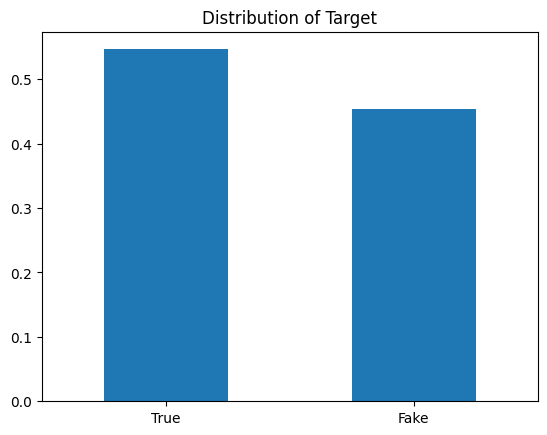

In [25]:
plot_target_distribution(df_train_1['target'])
print(f"Rows of training set: {X_train_1.shape[0]}")
print(f"Rows of validation set: {X_valid_1.shape[0]}")
print(f"Rows of test set: {X_test_1.shape[0]}")

The stratified split is slightely imbalanced with proportion 0.55 and 0.45 for true and fake news respectively.

In [26]:
# Second approach split
df_2 = df[['title', 'text', 'target', 'date']]
df_2 = df_2.dropna(subset=['date'])
df_train_2 = df_2.loc[df_2['date'] < '2017-09-08'].reset_index(drop=True)
df_temp_2 = df_2.loc[df_2['date'] >= '2017-09-08']
majority_class = df_temp_2[df_temp_2['target'] == 0]
minority_class = df_temp_2[df_temp_2['target'] == 1]
undersampled_majority_class = majority_class.sample(n=len(minority_class),
                                                    replace=False, random_state=123)
df_temp_2 = pd.concat([undersampled_majority_class, minority_class])
X_temp_2 = df_temp_2.drop(['target'], axis=1)
y_temp_2 = df_temp_2['target']
X_valid_2, X_test_2, y_valid_2, y_test_2 = train_test_split(X_temp_2, y_temp_2,
                                                            test_size=0.5,
                                                            random_state=123,
                                                            stratify=y_temp_2)
df_valid_2 = X_valid_2
df_valid_2['target'] = y_valid_2
df_valid_2 = df_valid_2.reset_index(drop=True)
df_test_2 = X_test_2
df_test_2['target'] = y_test_2
df_test_2 = df_test_2.reset_index(drop=True)

Rows of training set: 19690
Rows of validation set: 494
Rows of test set: 494


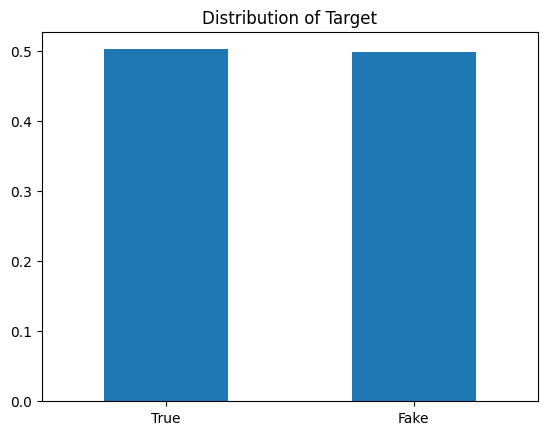

In [27]:
plot_target_distribution(df_train_2['target'])
print(f"Rows of training set: {df_train_2.shape[0]}")
print(f"Rows of validation set: {df_valid_2.shape[0]}")
print(f"Rows of test set: {df_test_2.shape[0]}")

## Analysis of text features based on training set from stratified split



* Proportion of upper case letters
* Number of upper case letters
* Average word length in each news
* Length of strings
* Number of words
* Most important unigrams, bigrams and trigrams
* Term frequency-inverse document frequency for 10 most common unigrams
* Proportion of punctuation to the whole text
* Number of exclamation marks


We will start with building dataframe with most important counts and fractions in analysing text.

In [28]:
df_features = build_feature_df(df_train_1, 'text')
df_features['target'] = df_train_1['target']
df_features['text'] = df_train_1['text'].map(prepare_text)
df_features.head()

,upper_case,avg_word_len,str_len,words_len,punct_prop,exc_prop,dot_prop,target,text
0,0.024560,5.296392,2443,388,0.007368,0.0,0.007368,1,religious right attempt stop women exercising ...
1,0.046729,5.524390,535,82,0.003738,0.0,0.003738,0,paris reuters french president emmanuel macron...
2,0.054194,5.102362,1550,254,0.010968,0.0,0.009677,1,sometimes politics get ridiculous one forced w...
3,0.035336,4.960843,3962,664,0.010601,0.0,0.010601,0,brussels reuters european union determined go ...
4,0.023300,4.878378,2618,444,0.010313,0.0,0.010313,0,juba reuters warravaged south sudan considerin...


Now let's visualise the most important grams in the text column.

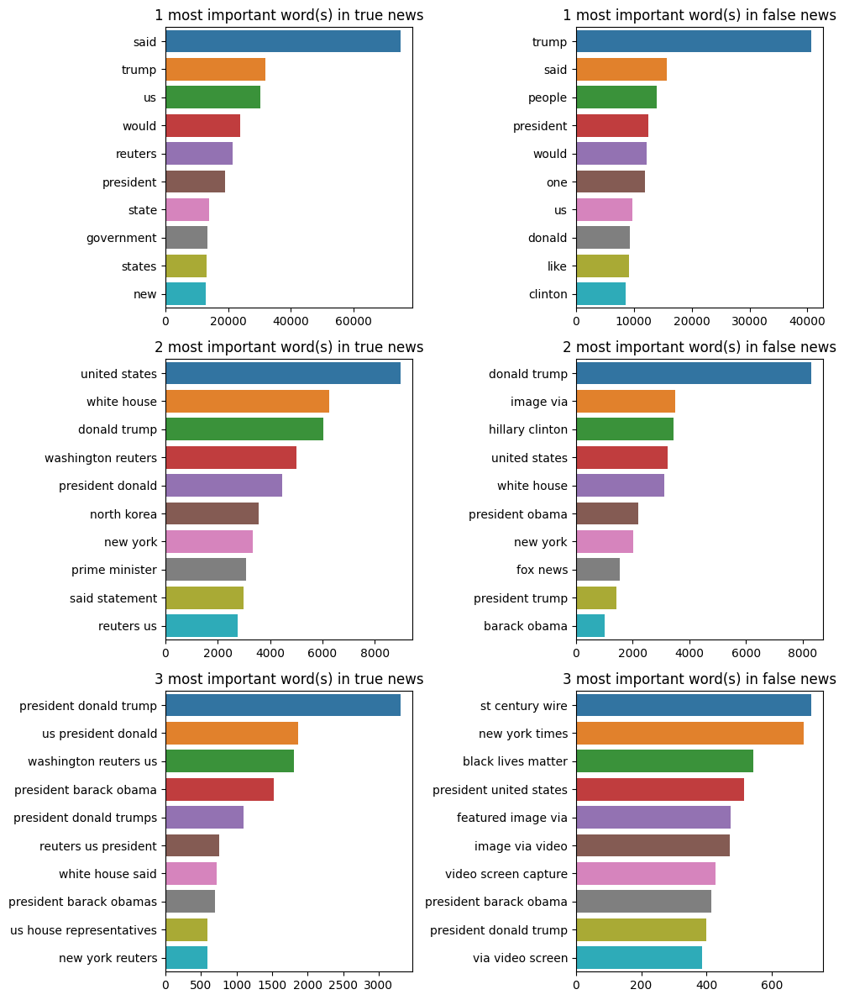

In [29]:
corpuses = [df_features[df_features['target']==0]['text'], df_features[df_features['target']==1]['text']]
compare_grams(corpuses, ['true', 'false'],  [1, 2, 3])

And 30 most important unigrams.

In [ ]:
thirty_grams = get_top_text_ngrams(df_features['text'], 1, n=30)
thirty_grams = [t[0] for t in thirty_grams]
thirty_grams

['said',
 'trump',
 'us',
 'would',
 'president',
 'people',
 'reuters',
 'one',
 'state',
 'new',
 'also',
 'states',
 'house',
 'government',
 'donald',
 'republican',
 'could',
 'united',
 'told',
 'clinton',
 'obama',
 'white',
 'campaign',
 'last',
 'election',
 'two',
 'like',
 'party',
 'time',
 'year']

We can see that some of the grams won't generalize well as they only apply to the politics.

To generalize as best as possible we will choose common words for Tf-Idf columns. Not connected in any sense to the politics.

Now let's visualise distribution of calculated features for fake and true news.

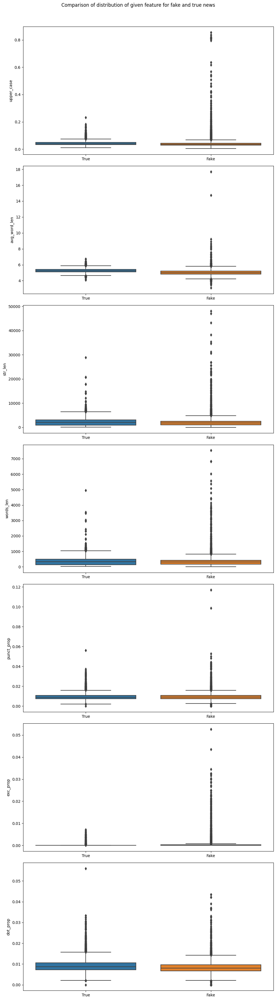

In [30]:
plot_features(df_features[['target', 'upper_case', 'avg_word_len', 'str_len', 'words_len', 'punct_prop',
       'exc_prop', 'dot_prop']])

* Uppercase is predominant in fake news - most likely to grab attention
* The average length of the words in true news is consistent - fake news can potentially have skipped white spaces
* On average true news are a bit longer but fake news can have a couple of outliers
* In true news the words are on average longer which could suggest more sophisticated use of words
* Fake news have more exclamation marks while true news more dots

# Modeling with the use of classic ML models

To generalize as best as possible we will use weighted f1-score as the data with stratified split is slightly imbalanced. The threshold will be established based on f1-score.

We will check a couple of approaches to determin which could produce best generalizing model with. For each of modeling experiments we will use engineered features as well as vectorized words which are common and not associated with presidential elections but still associated with politics.

We will check the preformance for both splits to see which one has better predictive power. The tree based models will be slightly udjusted to prevent obvious overfitting.


## First split modeling

In [31]:
models = {
    'dt': DecisionTreeClassifier(max_depth=7),
    'rfc': RandomForestClassifier(n_estimators=10, max_depth=8),
    'lr': LogisticRegression(),
    'gnb': GaussianNB()
}
cal_names = ['upper_case', 'avg_word_len', 'str_len',
                'words_len', 'punct_prop', 'exc_prop', 'dot_prop']


### Models based on calculated features only

In [32]:
X_train_1 = df_train_1.drop(['target'], axis=1)
y_train_1 = df_train_1['target']
X_valid_1 = df_valid_1.drop(['target'], axis=1)
y_valid_1 = df_valid_1['target']

df_scores = train_and_evaluate(models,
                               X_train_1,
                               y_train_1,
                               X_valid_1,
                               y_valid_1)
df_scores

,threshold,f1_train,f1_valid
dt,0.47,0.778760,0.765493
rfc,0.40,0.799793,0.785794
lr,0.47,0.783220,0.776811
gnb,0.30,0.607863,0.614911


* The best preforming model turned out to be RandomForestClassifier and LogisticRegression which reached out f1_score close to 0.77- both models are overfitting slightly on training set (possibly by setting the threshold based on it).

* The least performing model was GaussianNB with poorer f1_scores for training and validation.

### Models based on calculated features and some of the most often accuring words that are of common use

In [33]:
best_words = ['said', 'would', 'people', 'one', 'new', 'also',
              'could','told','last','two','like','time','year']
df_scores = train_and_evaluate(models,
                               X_train_1,
                               y_train_1,
                               X_valid_1,
                               y_valid_1,
                               best_words)
df_scores

,threshold,f1_train,f1_valid
dt,0.49,0.873103,0.861395
rfc,0.46,0.888643,0.875941
lr,0.54,0.879757,0.878503
gnb,0.30,0.814393,0.816527


* This time LogisticRegression model didn't overfit.
* Still RandomForestClassifier had better results.
* Addition of vectorized common words helped to get the f1_score close to 0.88 improving the score by more than 10%.

## Second split analysis

### Calculated features only

In [34]:
X_train_2 =  df_train_2.drop(['target'], axis=1)
y_train_2 = df_train_2['target']
X_valid_2 = df_valid_2.drop(['target'], axis=1)
y_valid_2= df_valid_2['target']

In [35]:
df_scores = train_and_evaluate(models,
                               X_train_2,
                               y_train_2,
                               X_valid_2 ,
                               y_valid_2 ,
                                   )
df_scores

,threshold,f1_train,f1_valid
dt,0.49,0.826171,0.758824
rfc,0.49,0.848962,0.764193
lr,0.51,0.813215,0.734338
gnb,0.30,0.763753,0.732723


* Models overfit more which can be due how the split was done or the fact that the model performs poorly on the news from the features
* RandomForestClassifier performs best so far.
* In general the performance on validation data is comparable to what we've achieved with the first split.

### Models based on calculated features and some of the most often accuring words that are of common use

In [36]:
best_words = ['said', 'would', 'people', 'one', 'new', 'also',
              'could','told','last','two','like','time','year']
df_scores = train_and_evaluate(models,
                               X_train_2,
                               y_train_2,
                               X_valid_2 ,
                               y_valid_2 ,
                               best_words)
df_scores

,threshold,f1_train,f1_valid
dt,0.50,0.899441,0.908889
rfc,0.49,0.924223,0.906869
lr,0.49,0.910810,0.906876
gnb,0.30,0.863379,0.876493


* The performance improved, models generalize better and give better results.
* RandomForestClassifier performs best with f1_score = 0.90
* Although after accessing the performance on the training set we got results comparable to the first split approach as follow.


## Getting best performing model

Let's estimate what will be the output of the testing for both kind of splits with previously checked tresholds.

In [37]:
print("First split testing")
pipeline_1 = get_pipeline(RandomForestClassifier(n_estimators=10, max_depth=8, min_samples_leaf=10, max_features=0.7), best_words)
pipeline_1.fit(X_train_1, y_train_1)
X_test_1 = df_test_1.drop(['target'], axis=1)
y_test_1 = df_test_1['target']
y_pred_1 = np.where(pipeline_1.predict_proba(X_test_1)[:, 1] > 0.52, 1, 0)
print(f"Weighted f1_score best performing model: {f1_score(y_test_1, y_pred_1, average='weighted'):.2f}")

print("Second split testing")
pipeline_2 = get_pipeline(RandomForestClassifier(n_estimators=10, max_depth=8, min_samples_leaf=10, max_features=0.7), best_words)
pipeline_2.fit(X_train_2, y_train_2)
X_test_2 = df_test_2.drop(['target'], axis=1)
y_test_2 = df_test_2['target']
y_pred_2 = np.where(pipeline_2.predict_proba(X_test_2)[:, 1] > 0.54, 1, 0)
print(f"Weighted f1_score best performing model: {f1_score(y_test_2, y_pred_2, average='weighted'):.2f}")

First split testing
Weighted f1_score best performing model: 0.88
Second split testing
Weighted f1_score best performing model: 0.85


It looks like the second split has tendencies to overfit. Because of this we will follow with the stratified split of data.

In [38]:
pipeline_1

Pipeline(steps=[('features',
                 FeatureUnion(transformer_list=[('calc_features',
                                                 FunctionTransformer(func=<function build_feature_df at 0x7caecfebeb00>)),
                                                ('vec_features',
                                                 ColumnTransformer(transformers=[('vec_features',
                                                                                  TfidfVectorizer(preprocessor=<function prepare_text at 0x7caecfebea70>,
                                                                                                  vocabulary=['said',
                                                                                                              'would',
                                                                                                              'people',
                                                                                                              'one',
                                                                                                              'new',
                                                                                                              'also',
                                                                                                              'could',
                                                                                                              'told',
                                                                                                              'last',
                                                                                                              'two',
                                                                                                              'like',
                                                                                                              'time',
                                                                                                              'year']),
                                                                                  'text')]))])),
                ('scaler', StandardScaler()),
                ('model',
                 RandomForestClassifier(max_depth=8, max_features=0.7,
                                        min_samples_leaf=10,
                                        n_estimators=10))])

In [29]:
with open('/content/drive/MyDrive/Colab/FakeNews/rfc_pipe.pkl', 'wb') as file:
    pickle.dump(pipeline_1, file)

## Evaluation of the best performing classic ML model

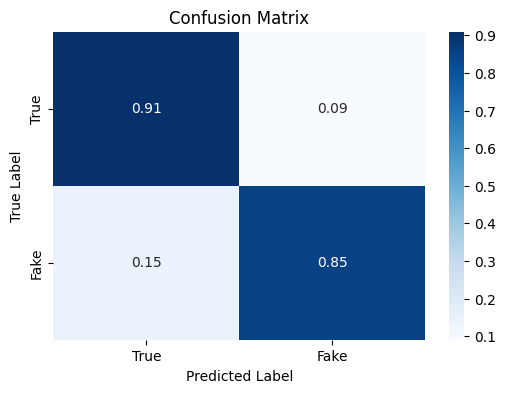


Classification Report:
              precision    recall  f1-score   support

        True       0.88      0.91      0.90      2023
        Fake       0.89      0.85      0.87      1678

    accuracy                           0.88      3701
   macro avg       0.88      0.88      0.88      3701
weighted avg       0.88      0.88      0.88      3701



In [39]:
cm = confusion_matrix(y_test_1, y_pred_1, normalize='true')
plt.figure(figsize=(6, 4))
classes = ['True', 'Fake']
sns.heatmap(cm, annot=True,cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

report = classification_report(y_test_1, y_pred_1, target_names=classes)
print()
print("Classification Report:")
print(report)

* The most often mistake that the model makes is on predicting that the news is true while is fake.
* The weighted accuracy is equal to 0.88
* It's harfer to pick up all fake news by the model than the true once.

Now let's analyse the most important features from our model

In [40]:
trans_pipe = Pipeline(pipeline_1.steps[:2])
cal_names = ['upper_case', 'avg_word_len', 'str_len',
                'words_len', 'punct_prop', 'exc_prop', 'dot_prop']
best_rfc = pipeline_1.named_steps['model']
feature_names = cal_names + best_words
X_test = pd.DataFrame(trans_pipe.transform(X_test_1), columns= feature_names)
X_test.head(1)

,upper_case,avg_word_len,str_len,words_len,punct_prop,exc_prop,dot_prop,said,would,people,one,new,also,could,told,last,two,like,time,year
0,0.726717,-0.83953,-0.639573,-0.618885,3.876717,-0.193774,4.570823,1.523142,-0.107531,-0.662534,0.189534,-0.586174,-0.658687,-0.559508,0.448291,0.652943,0.673935,-0.501205,-0.509023,-0.48148


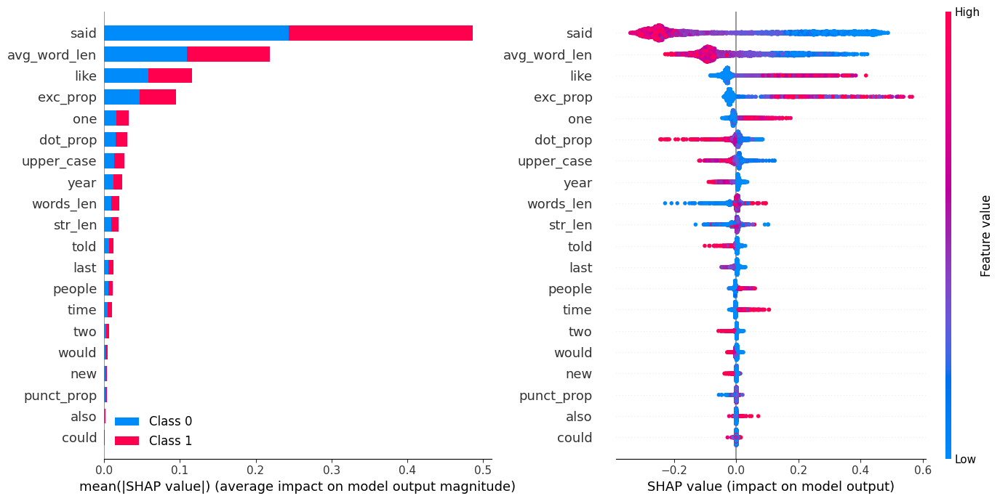

In [41]:
import shap
feature_names = cal_names + best_words
exp = shap.TreeExplainer(best_rfc)
vals = exp.shap_values(X_test)

plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
shap.summary_plot(vals, X_test, feature_names=feature_names, plot_type="bar", show=False, plot_size=None)

plt.subplot(1,2,2)
shap.summary_plot(vals[1], X_test, feature_names=feature_names, show=False, plot_size=None)

plt.tight_layout()
plt.show()

* The most important words for predicting the class were 'said', 'us' and the average length of words. True news had highier average length of words which means that people who wrote them are more linguisticaly prepared for the job.
* Low values of word said, us, average word length, proportion of dots, proportion of upper case letters and some other common words had positive inpact of predicting false news.
* Low values of words 'like', 'people', 'one', number of exxclamation marks helped in prediction of true news.

# Neural Network with pretrained model

Still we aim for finding a model that would generalize well on news not neccessarly political. For this reason we will remove most words connected to politics and leave the words that are common.

We will also aim on removing the source of the news from true news.

We will use distilbert cased as we saw previously how impactful the case of the letters is. Also distilbert's size with additional layers will reach up to 750MB while the initial pipeline for RandomForstClassifier 270KB. Based on the business needs we should consider those sizes.

Here also we will compare two approaches:

1) Training cased distilbert model on titles of news only

2) Training cased distilbert model on text of news only

## Downloading tokenizer and pretrained base model

In [42]:
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-cased")
base = AutoModelForSequenceClassification.from_pretrained("distilbert-base-cased", num_labels=2)

tokenizer_config.json:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/465 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/263M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-cased and are newly initialized: ['pre_classifier.weight', 'pre_classifier.bias', 'classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [43]:
BATCH_SIZE = 64
NUM_WORKERS = 2
words = [
 'trump',
 'president',
 'reuters',
 'hillary',
 'state',
 'government',
 'house',
 'donald',
 'states',
 'republican',
 'clinton',
 'united',
 'obama',
 'white',
 'campaign',
 'party',
 'election',
 'washington',
 'jr']
URL = '/content/drive/MyDrive/Colab/FakeNews/'

## Dataset

In [44]:
class NewsDataset(Dataset):
    """
    PyTorch Dataset for news classification.

    Args:
        df (pd.DataFrame): DataFrame containing the dataset.
        tokenizer: Tokenizer for encoding text.
        words (List[str]) : Words to remove during text preprocessing.
        max_sequence_length (int, optional): Maximum sequence length. Defaults to 64.
        col (str, optional): Column name containing text data. Defaults to 'text'.
    """

    def __init__(self, df: pd.DataFrame, tokenizer, words: List[str],
                 max_sequence_length: int = 64, col: str = 'text'):
        self.tokenizer = tokenizer
        self.df = df
        self.max_sequence_length = max_sequence_length
        self.words = words
        self.col = col

    def __len__(self) -> int:
        """Get the length of the dataset."""
        return len(self.df)

    def preprocess_text(self, text: str) -> str:
        """Preprocess text data by removing specified words"""
        if (self.col == 'text') and ('reuters' in text.lower().split()):
            text = " ".join(text.split()[2:])
        text = remove_words(text, self.words)
        return text

    def __getitem__(self, idx) -> dict:
        """Get an item from the dataset."""
        if torch.is_tensor(idx):
            idx = idx.tolist()
        bert_input = self.tokenizer.encode_plus(
            self.preprocess_text(self.df.iloc[idx].loc[self.col]),
            add_special_tokens=True,
            max_length=self.max_sequence_length,
            padding='max_length',
            return_attention_mask=True,
            truncation=True,
            return_tensors="pt"
        )

        bert_input = {k: v.squeeze(0) for k, v in bert_input.items()}
        if 'target' in self.df.columns:
            label = self.df.loc[idx, ['target']]
            bert_input['labels'] = torch.tensor([label], dtype=torch.float).squeeze()
        return bert_input

### Distilbert Cased Base Classifier

In [45]:
class NewsModel(pl.LightningModule):
    """
    PyTorch Lightning module for a news classification model.

    Args:
        base (nn.Module): Base model for classification.
        lr (float, optional): Learning rate for optimization. Defaults to 1e-4.
        thres (float, optional): Threshold for binary classification. Defaults to 0.5.
    """

    def __init__(self, base: nn.Module, lr: float = 1e-4, thres: float = 0.5):
        super().__init__()
        self.classifier = base
        self.base_grad(False)
        self.lr = lr
        self.thres = thres
        self.criterion = BCELoss()
        self.accuracy = BinaryAccuracy()

    def base_grad(self, requires_grad: bool):
        """
        Set the gradient requirement for the base model.
        Args:
            requires_grad (bool): Whether to require gradients or not.
        """
        for param in self.classifier.base_model.parameters():
            param.requires_grad = requires_grad

    def forward(self,
                input_ids: torch.Tensor,
                attention_mask: torch.Tensor,
                labels: torch.Tensor = None) -> Tuple[torch.Tensor, torch.Tensor]:
        """
        Forward pass of the model.

        Args:
            input_ids (torch.Tensor): Input tensor of token IDs.
            attention_mask (torch.Tensor): Attention mask tensor.
            labels (torch.Tensor, optional): Target labels tensor if present.
        Returns:
            Tuple[torch.Tensor, torch.Tensor]: Model output as  and loss.
        """
        output = self.classifier(input_ids, attention_mask=attention_mask)
        out = torch.softmax(output.logits, dim=-1)[:, 1]
        loss = 0
        if labels is not None:
            labels = labels.squeeze()
            loss = self.criterion(out, labels)
        return out, loss

    def configure_optimizers(self):
        """
        Configure the optimizer for training.
        Returns:
            AdamW: AdamW optimizer.
        """
        return AdamW(
            [p for p in self.parameters() if p.requires_grad], lr=self.lr, eps=1e-08
        )

    def training_step(self, batch, batch_idx):
        """
        Training step for the Lightning module.

        Args:
            batch: Input batch.
            batch_idx: Index of the current batch.

        Returns:
            torch.Tensor: Training loss.
        """
        outputs = self(**batch)
        out, loss = outputs[0], outputs[1]
        predictions = (out > self.thres).long()
        acc = self.accuracy(predictions, batch['labels'])
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_acc", acc, prog_bar=True)
        return loss

    def validation_step(self, val_batch, batch_idx):
        """
        Validation step for the Lightning module.

        Args:
            val_batch: Validation batch.
            batch_idx: Index of the current validation batch.

        Returns:
            torch.Tensor: Validation loss.
        """
        outputs = self(**val_batch)
        out, loss = outputs[0], outputs[1]
        predictions = (out > 0.5).long()
        acc = self.accuracy(predictions, val_batch['labels'])
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc", acc, prog_bar=True)
        return loss

    def train_dataloader(self):
        """
        Train DataLoader.
        Returns:
            DataLoader: DataLoader for training dataset.
        """
        loader = DataLoader(
            dataset_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS
        )
        return loader

    def val_dataloader(self):
        """
        Validation DataLoader.
        Returns:
            DataLoader: DataLoader for validation dataset.
        """
        loader = DataLoader(
            dataset_val, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS
        )
        return loader

### Callbacks

In [46]:
class MyPrintingCallback(Callback):
    """
    Custom PyTorch Lightning callback for printing training information.
    Attributes:
        train_losses (List[float]): List to store training losses for each epoch.
        valid_losses (List[float]): List to store validation losses for each epoch.
        train_accs (List[float]): List to store training accuracies for each epoch.
        valid_accs (List[float]): List to store validation accuracies for each epoch.

    Methods:
    - on_train_start(trainer, pl_module): Callback method triggered at the start of training.
    - on_train_epoch_end(trainer, pl_module): Callback method triggered at the end of each training epoch.
    - on_validation_epoch_end(trainer, pl_module): Callback method triggered at the end of each validation epoch.
    """
    def __init__(self):
        super().__init__()
        self.train_losses: List[float] = []
        self.valid_losses: List[float] = []
        self.train_accs: List[float] = []
        self.valid_accs: List[float] = []

    def on_train_start(self, trainer, pl_module):
        """
        Callback method triggered at the start of training.
        Args:
            trainer (Trainer): PyTorch Lightning trainer.
            pl_module (LightningModule): PyTorch Lightning module.
        """
        print("Training is starting")

    def on_train_epoch_end(self, trainer, pl_module):
        """
        Callback method triggered at the end of each training epoch.
        Args:
            trainer (Trainer): PyTorch Lightning trainer.
            pl_module (LightningModule): PyTorch Lightning module.
        """
        train_loss = trainer.callback_metrics["train_loss"]
        train_acc = trainer.callback_metrics['train_acc']
        self.train_losses.append(train_loss.item())
        self.train_accs.append(train_acc.item())
        print(f"Epoch {trainer.current_epoch}: train_loss={train_loss:.4f}, train_acc={train_acc:.2f}")

    def on_validation_epoch_end(self, trainer, pl_module):
        """
        Callback method triggered at the end of each validation epoch.
        Args:
            trainer (Trainer): PyTorch Lightning trainer.
            pl_module (LightningModule): PyTorch Lightning module.
        """
        valid_loss = trainer.callback_metrics["val_loss"]
        valid_acc = trainer.callback_metrics['val_acc']
        self.valid_losses.append(valid_loss.item())
        self.valid_accs.append(valid_acc.item())
        print(f"Epoch {trainer.current_epoch}: valid_loss={valid_loss:.4f}, valid_acc={valid_acc:.2f}")

## 1) Experiment with "title" column

To establish the size of max_length we will check description for titile column.

In [47]:
X_train_1['title'].apply(lambda x: len(x.split())).describe()

count    29601.000000
mean        11.924124
std          3.633922
min          1.000000
25%          9.000000
50%         11.000000
75%         14.000000
max         42.000000
Name: title, dtype: float64

In [67]:
dataset_train = NewsDataset(df_train_1, tokenizer, words, 14, 'title')
dataset_val = NewsDataset(df_valid_1, tokenizer, words, 14, 'title')
dataset_test = NewsDataset(df_test_1, tokenizer, words, 14, 'title')
dataset_train[0], " ".join(tokenizer.convert_ids_to_tokens(dataset_train[0]['input_ids'].squeeze().tolist()))

({'input_ids': tensor([  101,  8329,   118,   138, 12207,  2116, 12077,  9518, 16046,  2217,
           1130,  2868,  3177,   102]),
  'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  'labels': tensor(1.)},
 '[CLS] Anti - A ##bor ##tion Laws Col ##lap ##se In Major De [SEP]')

In [49]:
logger = TensorBoardLogger(
    URL, name="distilbert-title"
)

checkpoint_callback = ModelCheckpoint(
  dirpath= URL + "distilbert_checkpoints_title",
  filename="model-{epoch:02d}-{val_loss:.4f}",
  save_top_k=2,
  verbose=True,
  monitor="val_loss",
  mode="min"
)

early_stopping_callback = EarlyStopping(monitor='val_loss', patience=2)
printing_callback = MyPrintingCallback()

callbacks = [early_stopping_callback, checkpoint_callback, printing_callback]


The model will train the weights below for the first epoch and then finetune all layers.

In [50]:
model = NewsModel(base)
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)

classifier.pre_classifier.weight
classifier.pre_classifier.bias
classifier.classifier.weight
classifier.classifier.bias


In [54]:
training(
    model,
    logger,
    callbacks,
    train_epochs = 1,
    finetune_epochs = 8,
    train_lr = 1e-4,
    finetune_lr = 1e-5,
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type                                | Params
-------------------------------------------------------------------
0 | classifier | DistilBertForSequenceClassification | 65.8 M
1 | criterion  | BCELoss                             | 0     
2 | accuracy   | BinaryAccuracy                      | 0     
-------------------------------------------------------------------
592 K     Trainable params
65.2 M    Non-trainable params
65.8 M    Total params
263.132   Total estimated model params size (MB)


************************* Training *************************


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:pytorch_lightning.utilities.rank_zero:Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
Checkpoint directory /content/drive/MyDrive/Colab/FakeNews/distilbert_checkpoints_title exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type                                | Params
------------------------------------------------------------

************************* Training *************************


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Epoch 0: valid_loss=0.0000, valid_acc=1.00
Training is starting


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 232: 'val_loss' was not in top 2


Epoch 0: valid_loss=0.0087, valid_acc=1.00
Epoch 0: train_loss=0.0000, train_acc=1.00
Execution time: 0.0 hours.


### Explanation of the model

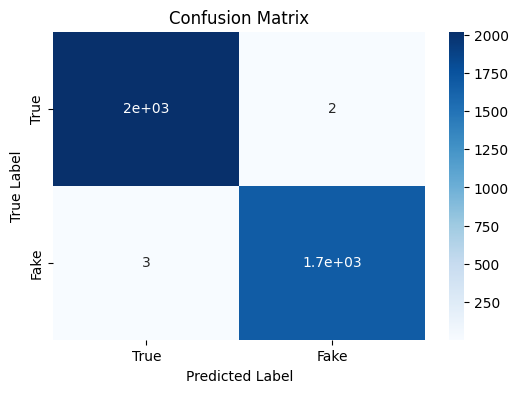


Classification Report:
              precision    recall  f1-score   support

        True       1.00      1.00      1.00      2023
        Fake       1.00      1.00      1.00      1678

    accuracy                           1.00      3701
   macro avg       1.00      1.00      1.00      3701
weighted avg       1.00      1.00      1.00      3701

Wrongly classified: [86, 1033, 1236, 2977, 3089]


In [68]:
dl_test = DataLoader(
            dataset_test, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS
        )
checkpoint_path = '/content/drive/MyDrive/Colab/FakeNews/distilbert_checkpoints_title/model-epoch=01-val_loss=0.0054.ckpt'
model = NewsModel.load_from_checkpoint(checkpoint_path, base=base)
plot_clf_metrics(model, dl_test)

Out of 3701 samples the model predicted wrongly only 5 samples. Let's see those positions.

In [69]:
wrong_id = [86, 1033, 1236, 2977, 3089]
explainer = LimeTextExplainer(class_names=['True', 'False'])
for sample in wrong_id:
    text_sample = df_test_1.iloc[sample]['title']
    explanation = explainer.explain_instance(text_sample, predict_function, num_features=10)
    explanation.show_in_notebook(text=True)

It looks like the model picked up on the use of upper case letters as well as specific words that most likely appear more often for a certain type of news.

## 2) Experiment with "text" column

Initialization of datasets.

In [56]:
dataset_train = NewsDataset(df_train_1, tokenizer, words, 64, 'text')
dataset_val = NewsDataset(df_valid_1, tokenizer, words, 64, 'text')
dataset_test = NewsDataset(df_test_1, tokenizer, words, 64, 'text')

Initialization of variables for training.

In [57]:
logger = TensorBoardLogger(
    URL, name="distilbert-text"
)

checkpoint_callback = ModelCheckpoint(
  dirpath= URL + "distilbert_checkpoints_text",
  filename="model-{epoch:02d}-{val_loss:.4f}",
  save_top_k=2,
  verbose=True,
  monitor="val_loss",
  mode="min"
)

early_stopping_callback = EarlyStopping(monitor='val_loss', patience=2)
printing_callback = MyPrintingCallback()

callbacks = [early_stopping_callback, checkpoint_callback, printing_callback]

Training and finetuning the model.

In [58]:
model = NewsModel(base, 1e-4)
training(
    model,
    logger,
    callbacks,
    train_epochs = 1,
    finetune_epochs = 8,
    train_lr = 1e-4,
    finetune_lr = 1e-5,
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type                                | Params
-------------------------------------------------------------------
0 | classifier | DistilBertForSequenceClassification | 65.8 M
1 | criterion  | BCELoss                             | 0     
2 | accuracy   | BinaryAccuracy                      | 0     
-------------------------------------------------------------------
592 K     Trainable params
65.2 M    Non-trainable params
65.8 M    Total params
263.132   Total estimated model params size (MB)


************************* Training *************************


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
Checkpoint directory /content/drive/MyDrive/Colab/FakeNews/distilbert_checkpoints_text exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type                                | Params
-------------------------------------------------------------------
0 | classifier | DistilBertForSequenceClassification | 65.8 M
1 | criterion  | BCELoss                             | 0     
2 | accuracy   | BinaryAccuracy                      | 0     
---------------------------

************************* Training *************************


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Epoch 0: valid_loss=0.1301, valid_acc=0.98
Training is starting


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 232: 'val_loss' reached 0.06520 (best 0.06520), saving model to '/content/drive/MyDrive/Colab/FakeNews/distilbert_checkpoints_text/model-epoch=00-val_loss=0.0652.ckpt' as top 2


Epoch 0: valid_loss=0.0652, valid_acc=0.98
Epoch 0: train_loss=0.1304, train_acc=0.91


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 464: 'val_loss' reached 0.05358 (best 0.05358), saving model to '/content/drive/MyDrive/Colab/FakeNews/distilbert_checkpoints_text/model-epoch=01-val_loss=0.0536.ckpt' as top 2


Epoch 1: valid_loss=0.0536, valid_acc=0.98
Epoch 1: train_loss=0.0766, train_acc=0.97


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 696: 'val_loss' reached 0.04480 (best 0.04480), saving model to '/content/drive/MyDrive/Colab/FakeNews/distilbert_checkpoints_text/model-epoch=02-val_loss=0.0448.ckpt' as top 2


Epoch 2: valid_loss=0.0448, valid_acc=0.99
Epoch 2: train_loss=0.0111, train_acc=1.00


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 928: 'val_loss' was not in top 2


Epoch 3: valid_loss=0.0668, valid_acc=0.98
Epoch 3: train_loss=0.0049, train_acc=1.00


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 1160: 'val_loss' was not in top 2


Epoch 4: valid_loss=0.0611, valid_acc=0.99
Epoch 4: train_loss=0.0008, train_acc=1.00
Execution time: 0.3 hours.


Displaying training in graphical way accesing values stored in the Tensorboard logger.

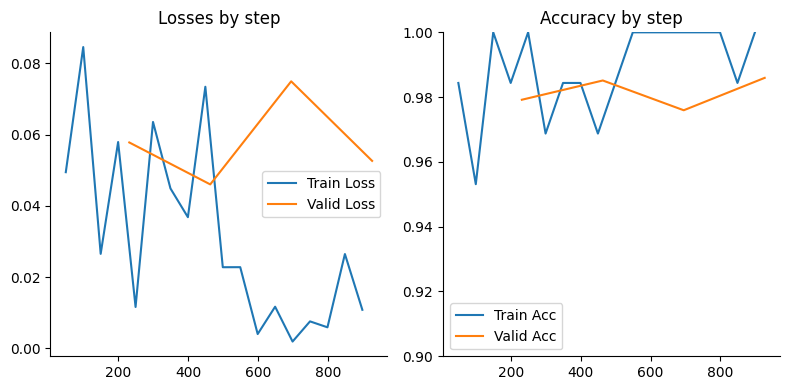

In [59]:
log_dir =  "/content/drive/MyDrive/Colab/FakeNews/distilbert-text/version_1"
event_acc = event_accumulator.EventAccumulator(log_dir)
event_acc.Reload()

train_loss_values = event_acc.scalars.Items('train_loss')
val_loss_values = event_acc.scalars.Items('val_loss')
train_acc_values = event_acc.scalars.Items('train_acc')
val_acc_values = event_acc.scalars.Items('val_acc')

train_loss_steps, train_loss_vals = zip(*[(event.step, event.value) for event in train_loss_values])
val_loss_steps, val_loss_vals = zip(*[(event.step, event.value) for event in val_loss_values])
train_acc_steps, train_acc_vals = zip(*[(event.step, event.value)for event in train_acc_values])
val_acc_steps, val_acc_vals = zip(*[(event.step, event.value)for event in val_acc_values])

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.title("Losses by step")
plt.plot(train_loss_steps, train_loss_vals, label='Train Loss')
plt.plot(val_loss_steps, val_loss_vals, label='Valid Loss')
sns.despine()
plt.legend()

plt.subplot(1, 2, 2)
plt.title("Accuracy by step")
plt.plot(train_acc_steps, train_acc_vals, label='Train Acc')
plt.plot(val_acc_steps, val_acc_vals, label='Valid Acc')
plt.ylim(0.9, 1.0)
sns.despine()
plt.legend()
plt.tight_layout()

### Explanation of the model

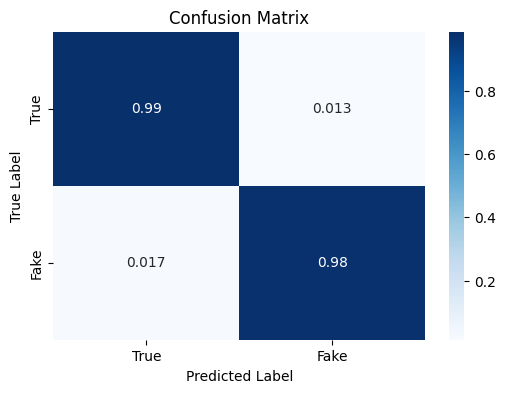


Classification Report:
              precision    recall  f1-score   support

        True       0.99      0.99      0.99      2023
        Fake       0.98      0.98      0.98      1678

    accuracy                           0.98      3701
   macro avg       0.98      0.98      0.98      3701
weighted avg       0.98      0.98      0.98      3701

Wrongly classified: [19, 70, 153, 163, 252, 415, 467, 588, 628, 634, 671, 782, 790, 791, 807, 833, 869, 893, 927, 1046, 1182, 1250, 1403, 1694, 1726, 1789, 1838, 1999, 2007, 2155, 2160, 2263, 2270, 2282, 2372, 2414, 2426, 2533, 2594, 2601, 2657, 2719, 2724, 2819, 2956, 2985, 3106, 3160, 3164, 3184, 3402, 3409, 3429, 3529, 3530, 3641]


In [60]:
checkpoint_path =  '/content/drive/MyDrive/Colab/FakeNews/distilbert_checkpoints_text/model-epoch=01-val_loss=0.0460.ckpt'
model = NewsModel.load_from_checkpoint(checkpoint_path, base=base)
dl_test = DataLoader(
            dataset_test, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS
        )
plot_clf_metrics(model, dl_test, norm='true')

This time the results are very close to 1. The predictions are almost perfect with around 3% of mislabeled data.

Let's see two of those predictions.

In [61]:
explainer = LimeTextExplainer(class_names=['True', 'False'])
for sample in [19, 671]:
    text_sample = df_test_1.iloc[sample]['text']
    explanation = explainer.explain_instance(text_sample, predict_function, num_features=10)
    explanation.show_in_notebook(text=True)

Let's check how much value the model made for **true news**.

In [62]:
surrogate = SuroggateModel.load_from_checkpoint(checkpoint_path, base=base)
test_arrow = {'labels': df_test_1['target'].tolist(),
              'text': df_test_1['text'].apply(lambda x: remove_words(x, words)).tolist()}
arrow_dataset = nlpDataset.from_dict(test_arrow)
indices = df_test_1.loc[df_test_1['target']==0].index[:10].tolist()
explainer = shap.Explainer(shap_func, tokenizer)
shap_values = explainer(arrow_dataset[indices], fixed_context=1)

Token indices sequence length is longer than the specified maximum sequence length for this model (774 > 512). Running this sequence through the model will result in indexing errors
PartitionExplainer explainer: 11it [00:31,  3.89s/it]


In [63]:
shap.plots.text(shap_values[[1]])

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


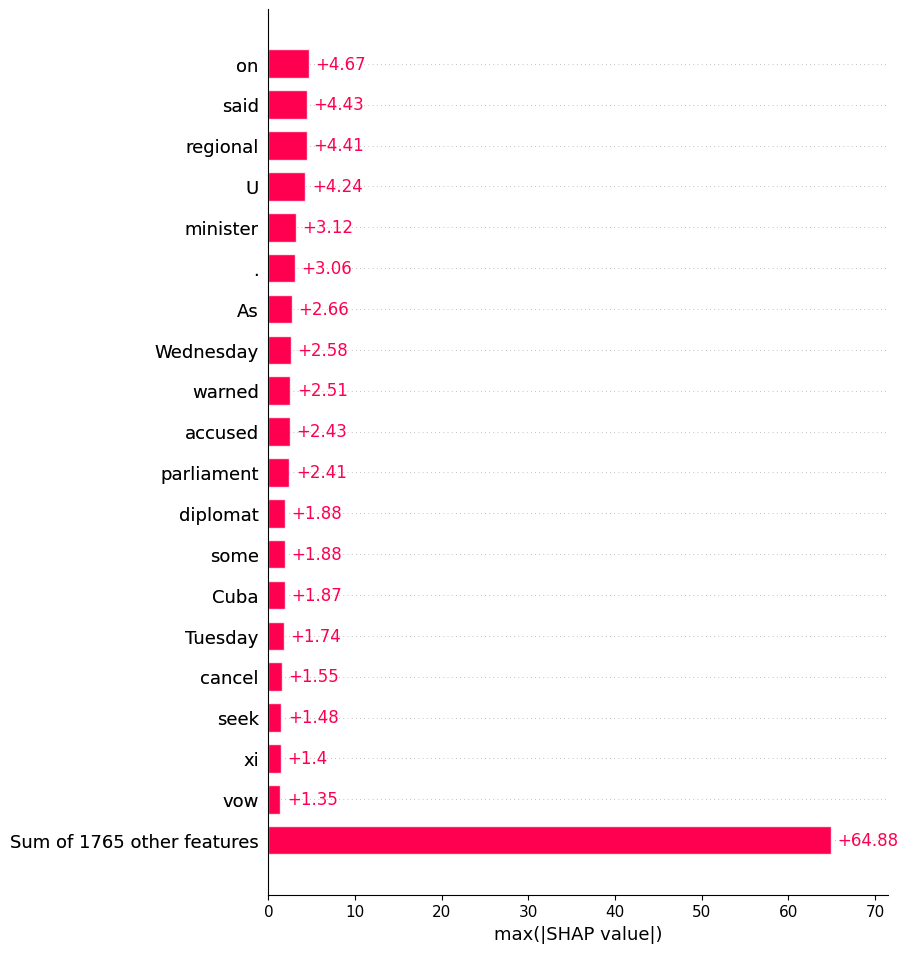

In [64]:
shap.plots.bar(shap_values.abs.max(0), 20)

And predictions for **fake news**.

PartitionExplainer explainer: 11it [00:21,  2.70s/it]


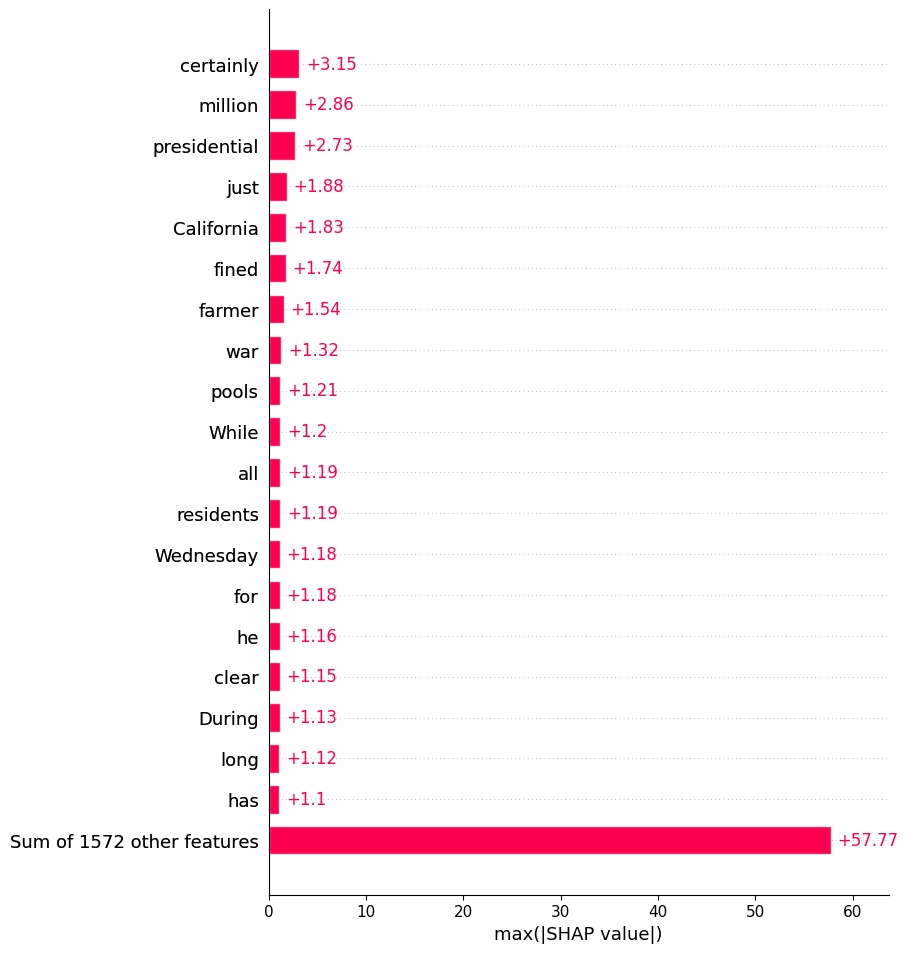

In [65]:
indices = df_test_1.loc[df_test_1['target']==1].index[:10].tolist()
explainer = shap.Explainer(shap_func, tokenizer)
shap_values = explainer(arrow_dataset[indices], fixed_context=1)
shap.plots.bar(shap_values.abs.max(0), 20)

In [66]:
shap.plots.text(shap_values[:2])

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


* For predictions of true news the most important words are 'on', 'said', U.S., days of week.
* The wrongly predicted values suggest that some very short and repetitive words play an important role.
* False predictions seems to be based on calling names as well. Although some of them were removed from the dataset, the model is still able to pick up on this trend.
* Words like 'certainly', 'just', 'you' are important in fake news. They are emotionaly suggestive.
* There may be some words that are most often used for certain type of writers.
* The model still relies to much of the structure of the text rather than it's meaning.

# Conclusions

* Models that were build through the analysis relay to much on the writer. They either pick up of the style of news with specifics like: certain words, length of used words, sophistication of the language, punctuation.
* Although the performance is impressive a skillfull columnist wouldn't have problems with writing fake news where the model would predict this as a true one.
* The models build here are were different in sizes. Pipeline with RandomForestClassifier takes 240KB while the distilbert weights 750MB.
This difference in size could be critical in establishing if we can sacrifice drop in performance by 10% to save on deployment.
* It turns out that the distilbert based model which has been trained on titles only is most accurate.
* Still know knowing how the data was collected couldn't guarantee that the model would predict any false news from other sources and this should  be verified.

# Improvements

* Optimization of code.
* Checking for additional features that can leak data about the predictions.
* Estimating the performance of different sets of data to establish if models are performing as good as in the notebook.
* Experimenting with uncased models.
* Building LSTM model which would be smaller but hopefully performed similar.











Source of shap explanation code: https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/text.html#id1